In [50]:
%load_ext autoreload
%reload_ext autoreload
%autoreload 2

from pathlib import Path
import sys; sys.path.insert(0, str(Path('.').resolve().parent / 'src'))
from config import CITIES, CityConfig, DATA_DIR, PLACES_PATH
from geo_utils import *
from plot_utils import *
from eval_utils import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# Define city configuration
city="houston"
cfg = CITIES[city]

In [3]:
# Load boundaries
# NOTE: Method used to label BG inside is if the centroid is inside city boundary
city_gdf = load_city_boundary(cfg)
bg_gdf = load_state_block_groups(cfg)
bg_gdf = label_bgs_within_city(bg_gdf, city_gdf)

Houston city boundary loaded: 1 row(s)
Houston state block groups loaded: 18,626
Block groups within city: 1,629 / 18,626


/home/eprashar_solutions_corelogic_com/crime-idx-2026/src/geo_utils.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  bg['centroid'] = bg.geometry.centroid


Block groups: 18,626 total | 1,629 within city | 16,997 outside


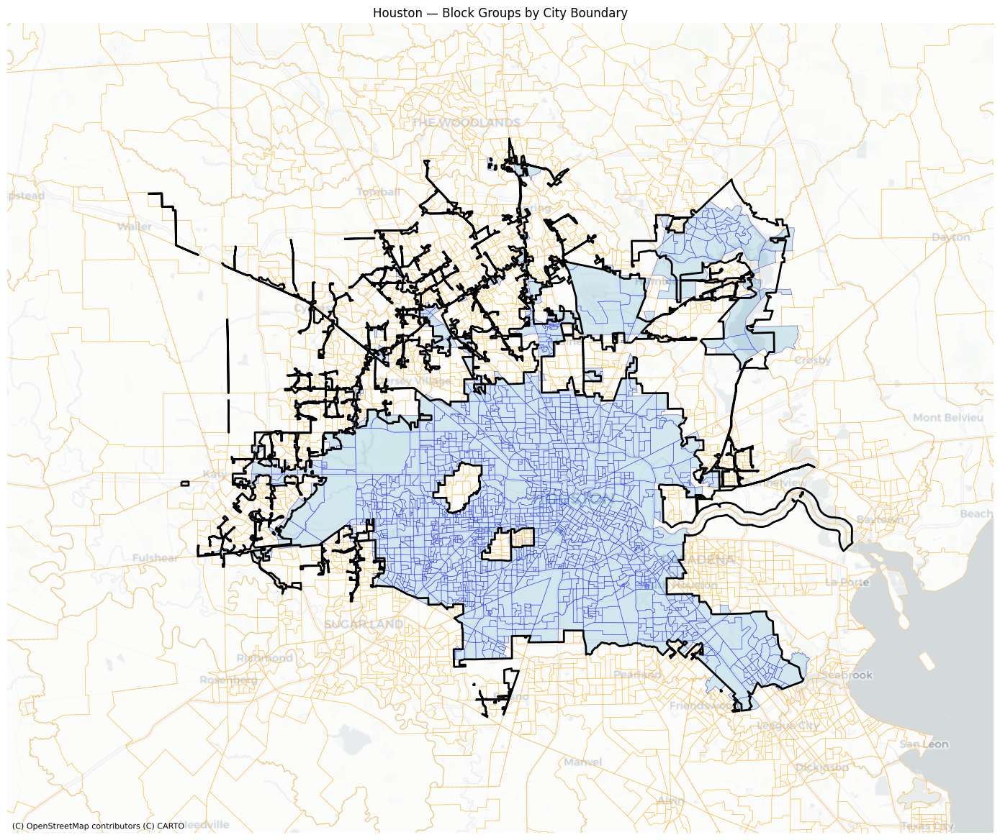

In [4]:
# Map: BGs colored by within/outside city
n_in = (bg_gdf['within_city'] == True).sum()
n_out = (bg_gdf['within_city'] == False).sum()
print(f"Block groups: {len(bg_gdf):,} total | {n_in:,} within city | {n_out:,} outside")
plot_city_with_bgs(bg_gdf, city_gdf, f"{cfg.name} — Block Groups by City Boundary")

In [5]:
# Load city crime data
crime_gdf = load_crime_data(cfg)

Houston crime data: 237,011 rows with valid coords (of 240,696)


Inside city: 235,042 | Outside: 1,969


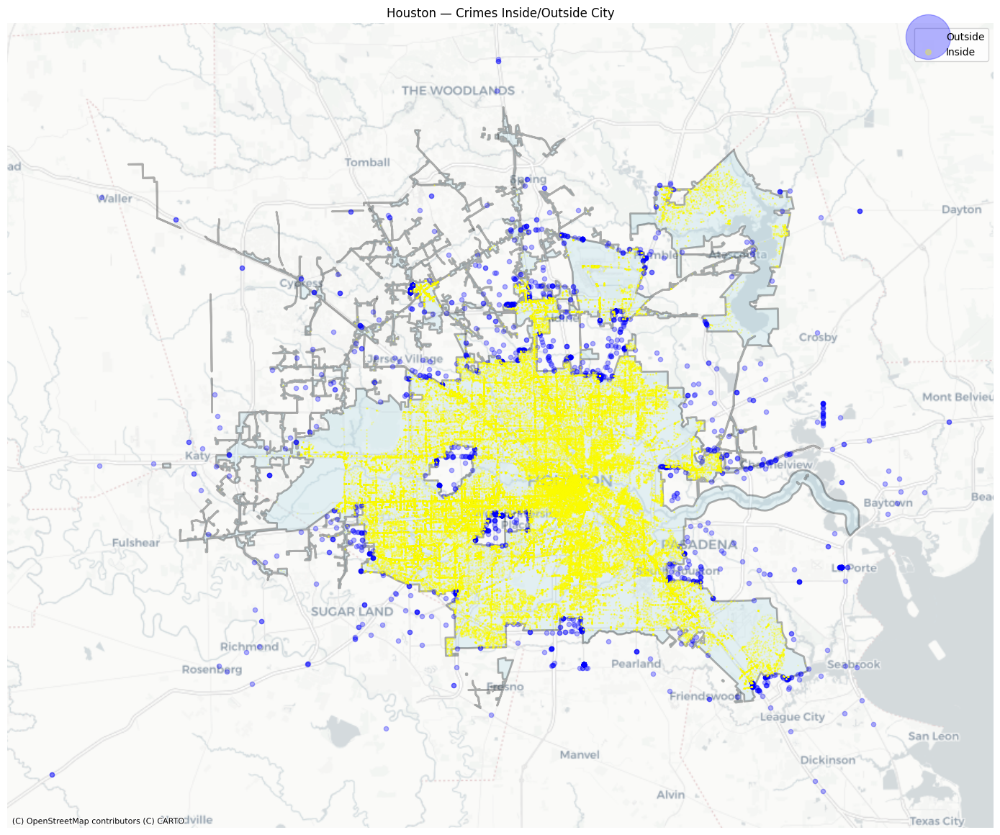

In [6]:
# Spatial join: crimes vs city boundary
inside, outside = sjoin_crimes_to_city(crime_gdf, city_gdf)
plot_crimes_vs_city(inside, outside, city_gdf, f"{cfg.name} — Crimes Inside/Outside City")

Matched to BG: 236,917 | Unmatched: 94
BGs with crimes: 2,079 (1,600 within city, 479 outside)
Crimes inside city: 228,536 | Outside: 8,381


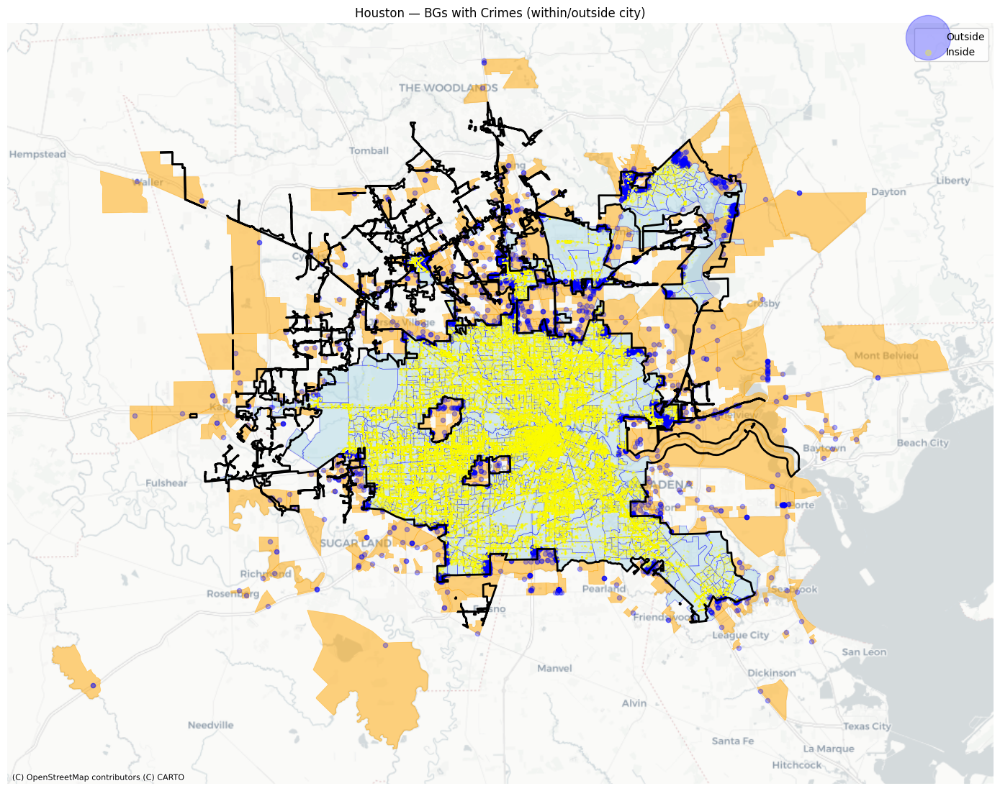

In [7]:
# Spatial join: crimes vs block groups
crime_bg = sjoin_crimes_to_bgs(crime_gdf, bg_gdf)
bg_agg = aggregate_by_bg(crime_bg)

# Crime counts inside/outside city
n_in = (crime_bg['within_city'] == True).sum()
n_out = (crime_bg['within_city'] == False).sum()
print(f"Crimes inside city: {n_in:,} | Outside: {n_out:,}")

plot_bg_crimes(bg_agg, city_gdf, f"{cfg.name} — BGs with Crimes (within/outside city)", crime_bg=crime_bg)

In [55]:
# Map crime categories
crime_bg = map_crime_categories(crime_bg, cfg)
bg_cat = aggregate_by_bg_category(crime_bg)

Mapped: 132,286 / 237,011 (55.8%)
Category counts:
crime_category
larceny     67789
vandal      20426
assault     13041
mvt         12355
burglary    11284
robbery      4973
rape         1921
murder        289
fire          208

Unmapped: 104,725 records across 38 codes
BG-level category aggregation: 2,079 BGs (1,600 within city, 479 outside)
Crime Totals:
assault_count      13032.0
murder_count         288.0
rape_count          1921.0
robbery_count       4971.0
burglary_count     11284.0
larceny_count      67775.0
mvt_count          12349.0
vandal_count       20421.0
violent_count      20212.0
property_count     91408.0
cl_total_count    111620.0
dtype: float64


In [9]:
# Folium interactive map
folium_bg_crimes(bg_cat, city_gdf, crime_bg, cfg,
                 output_dir=DATA_DIR.parent / 'notebooks' / 'folium_maps')

Saved /home/eprashar_solutions_corelogic_com/crime-idx-2026/notebooks/folium_maps/houston_bg_crimes.html


In [10]:
# Merge all BGs (including those with zero crime) with category data
bg_all = merge_all_bgs_with_crimes(bg_gdf, bg_cat)

Analysis set: 2,108 BGs
  Inside city:  1,629 (1,600 with data, 29 without)
  Outside city: 479 (all with crime data)


##### Distribution of City Crimes


Cl_Total Crime Count Distribution — Inside City (1,629 BGs)
count    1629.000
mean       66.101
std        83.512
min         0.000
25%        21.000
50%        42.000
75%        79.000
max      1014.000
Block groups with zero: 44 / 1,629 (2.7%)
------------------------------------------------------------
  P 1:        0   (1,629 BGs >= this)
  P 5:        3   (1,556 BGs >= this)
  P10:        9   (1,466 BGs >= this)
  P25:       21   (1,226 BGs >= this)
  P50:       42   (822 BGs >= this)
  P75:       79   (410 BGs >= this)
  P90:      145   (164 BGs >= this)
  P95:      205   (83 BGs >= this)
  P99:      431   (17 BGs >= this)


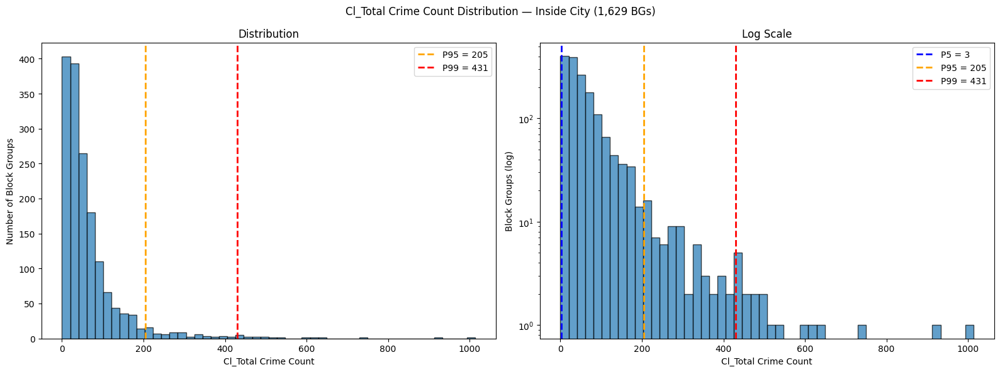

In [11]:
# Now distributions show the full picture including zero-crime BGs
plot_distribution(bg_all, crime_type='cl_total', suffix='count', block_groups='inside')

In [12]:
# Check percentage of different crime types
bg_cat_inside = bg_cat[bg_cat['within_city'] == True]
cl_total = bg_cat_inside['cl_total_count'].sum()
violent_total = bg_cat_inside['violent_count'].sum()
property_total = bg_cat_inside['property_count'].sum()

print(f"CL Total crimes inside city: {cl_total:,.0f}")
print(f"{'='*60}")

# Property vs Violent split
print(f"\n{'violent':>12}: {violent_total:>10,.0f}  ({violent_total/cl_total*100:>5.1f}% of total)")
print(f"{'property':>12}: {property_total:>10,.0f}  ({property_total/cl_total*100:>5.1f}% of total)")

# Violent breakdown
print(f"\n  Violent breakdown:")
for col in ['assault_count', 'murder_count', 'rape_count', 'robbery_count']:
    if col in bg_cat_inside.columns:
        val = bg_cat_inside[col].sum()
        print(f"    {col.replace('_count',''):>10}: {val:>10,.0f}  ({val/violent_total*100:>5.1f}% of violent)")

# Property breakdown
print(f"\n  Property breakdown:")
for col in ['burglary_count', 'larceny_count', 'mvt_count']:
    if col in bg_cat_inside.columns:
        val = bg_cat_inside[col].sum()
        print(f"    {col.replace('_count',''):>10}: {val:>10,.0f}  ({val/property_total*100:>5.1f}% of property)")

print(f"\n{'cl_total':>12}: {cl_total:>10,.0f}  (100.0%)")

CL Total crimes inside city: 107,678

     violent:     19,555  ( 18.2% of total)
    property:     88,123  ( 81.8% of total)

  Violent breakdown:
       assault:     12,614  ( 64.5% of violent)
        murder:        278  (  1.4% of violent)
          rape:      1,841  (  9.4% of violent)
       robbery:      4,822  ( 24.7% of violent)

  Property breakdown:
      burglary:     10,946  ( 12.4% of property)
       larceny:     65,385  ( 74.2% of property)
           mvt:     11,792  ( 13.4% of property)

    cl_total:    107,678  (100.0%)


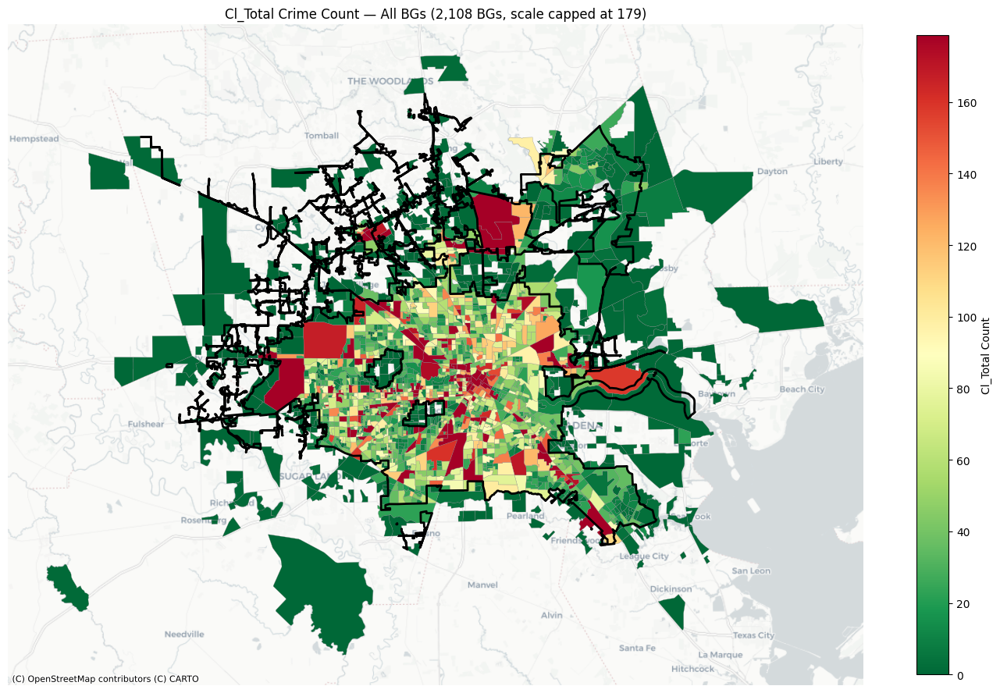

In [13]:
# Choropleth: total crime counts for all BGs
plot_bg_choropleth(bg_all, city_gdf, crime_type='cl_total', block_groups='all', 
                   cmap='RdYlGn_r', vmax=95)

##### Some cool experimentation to understand spatial patterns in crime

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse

def std_deviational_ellipse(gdf, weight_col='cl_total_count', crs_proj="EPSG:3857"):
    """
    Compute Standard Deviational Ellipse from block group centroids weighted by crime counts.
    
    Parameters
    ----------
    gdf : GeoDataFrame with polygon geometry and a weight column
    weight_col : column name for crime counts (weights)
    crs_proj : projected CRS for distance calculations (meters)
    
    Returns
    -------
    dict with keys: center_x, center_y, sigma_major, sigma_minor, angle_deg, axis_ratio
    """
    # Project to meters for meaningful distances
    proj = gdf.to_crs(crs_proj)
    centroids = proj.geometry.centroid
    
    x = centroids.x.values
    y = centroids.y.values
    w = gdf[weight_col].values.astype(float)
    
    # Exclude zero-weight BGs
    mask = w > 0
    x, y, w = x[mask], y[mask], w[mask]
    w_norm = w / w.sum()
    
    # Weighted mean center
    cx = np.average(x, weights=w_norm)
    cy = np.average(y, weights=w_norm)
    
    # Deviations
    dx = x - cx
    dy = y - cy
    
    # Weighted variance-covariance matrix
    var_x = np.average(dx**2, weights=w_norm)
    var_y = np.average(dy**2, weights=w_norm)
    cov_xy = np.average(dx * dy, weights=w_norm)
    
    cov_matrix = np.array([[var_x, cov_xy], [cov_xy, var_y]])
    eigvals, eigvecs = np.linalg.eigh(cov_matrix)
    
    # eigh returns eigenvalues in ascending order
    sigma_minor = np.sqrt(eigvals[0])
    sigma_major = np.sqrt(eigvals[1])
    
    # Angle of the major axis (from x-axis, counterclockwise)
    angle = np.degrees(np.arctan2(eigvecs[1, 1], eigvecs[0, 1]))
    
    return {
        'center_x': cx, 'center_y': cy,
        'sigma_major': sigma_major,  # meters
        'sigma_minor': sigma_minor,  # meters
        'angle_deg': angle,
        'axis_ratio': sigma_major / sigma_minor,  # >1 = elongated/directional
    }

# --- Usage in your notebook ---
inside_bgs = bg_all[bg_all['within_city'] == True].copy()
result = std_deviational_ellipse(inside_bgs, weight_col='cl_total_count')

print(f"Mean center (projected): ({result['center_x']:.0f}, {result['center_y']:.0f})")
print(f"Major axis σ: {result['sigma_major']:.0f} m")
print(f"Minor axis σ: {result['sigma_minor']:.0f} m")
print(f"Orientation:  {result['angle_deg']:.1f}°")
print(f"Axis ratio:   {result['axis_ratio']:.2f}")  # Houston ≈ 1.x (circular), Chicago ≈ 2+ (directional)

Mean center (projected): (-10622235, 3471494)
Major axis σ: 12036 m
Minor axis σ: 10905 m
Orientation:  179.6°
Axis ratio:   1.10


In [29]:
# 1. Baseline: SDE of city BGs with EQUAL weights (= pure city shape)
inside_bgs['uniform'] = 1.0
baseline = std_deviational_ellipse(inside_bgs, weight_col='uniform')

# 2. Crime-weighted SDE (what you already have)
crime_sde = std_deviational_ellipse(inside_bgs, weight_col='cl_total_count')

# 3. Compare
print(f"{'Metric':<20} {'City Shape':<15} {'Crime-Weighted':<15}")
print(f"{'Axis ratio':<20} {baseline['axis_ratio']:<15.2f} {crime_sde['axis_ratio']:<15.2f}")
print(f"{'Angle (°)':<20} {baseline['angle_deg']:<15.1f} {crime_sde['angle_deg']:<15.1f}")
print(f"{'Major σ (m)':<20} {baseline['sigma_major']:<15.0f} {crime_sde['sigma_major']:<15.0f}")
print(f"{'Minor σ (m)':<20} {baseline['sigma_minor']:<15.0f} {crime_sde['sigma_minor']:<15.0f}")

# Relative directionality: how much MORE directional is crime vs. the city shape?
relative_ratio = crime_sde['axis_ratio'] / baseline['axis_ratio']
angle_diff = crime_sde['angle_deg'] - baseline['angle_deg']
print(f"\nRelative axis ratio (crime / shape): {relative_ratio:.2f}")
print(f"Angle difference: {angle_diff:.1f}°")

Metric               City Shape      Crime-Weighted 
Axis ratio           1.12            1.10           
Angle (°)            -173.5          179.6          
Major σ (m)          14216           12036          
Minor σ (m)          12745           10905          

Relative axis ratio (crime / shape): 0.99
Angle difference: 353.0°


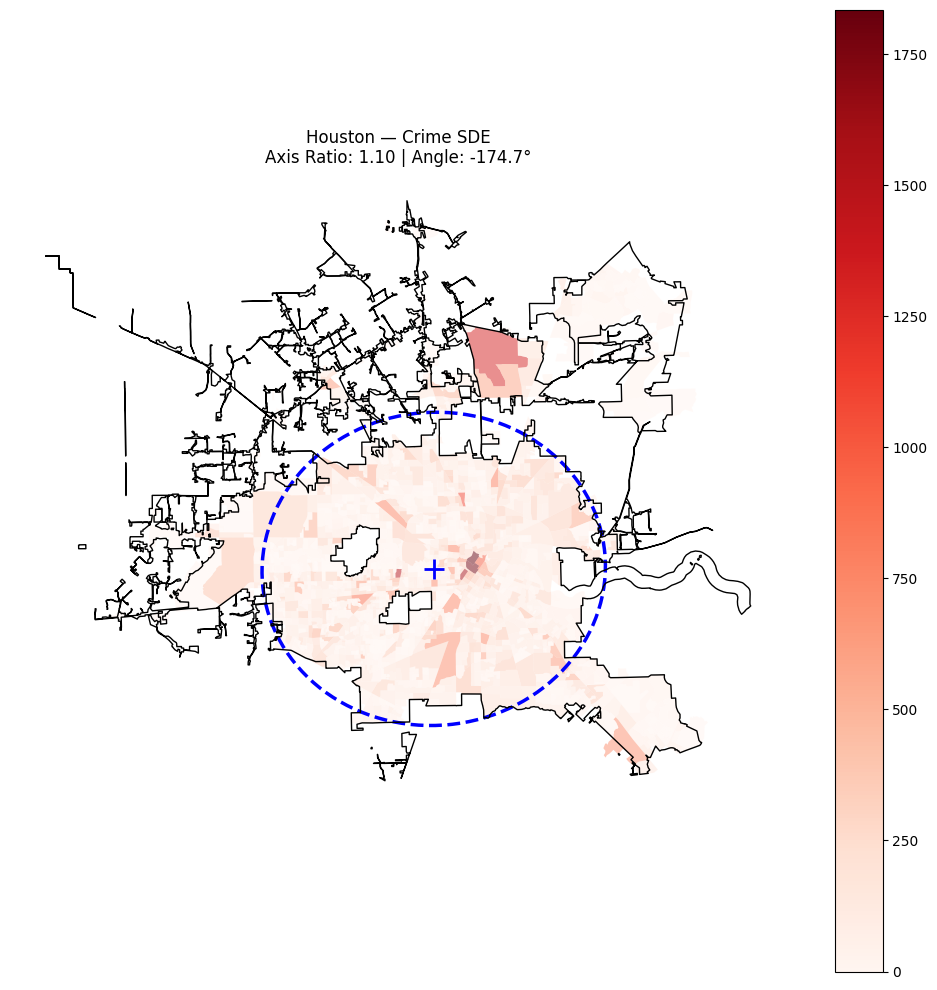

In [30]:
def plot_sde(gdf, city_gdf, weight_col='cl_total_count', title='Standard Deviational Ellipse'):
    proj_crs = "EPSG:3857"
    result = std_deviational_ellipse(gdf, weight_col, crs_proj=proj_crs)
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    gdf.to_crs(proj_crs).plot(ax=ax, column=weight_col, cmap='Reds', alpha=0.5, legend=True)
    city_gdf.to_crs(proj_crs).boundary.plot(ax=ax, color='black', linewidth=1)
    
    # Draw ellipse (2σ covers ~95% of weighted distribution)
    ellipse = Ellipse(
        (result['center_x'], result['center_y']),
        width=2 * result['sigma_major'] * 2,   # 2σ diameter
        height=2 * result['sigma_minor'] * 2,
        angle=result['angle_deg'],
        fill=False, edgecolor='blue', linewidth=2.5, linestyle='--'
    )
    ax.add_patch(ellipse)
    ax.plot(result['center_x'], result['center_y'], 'b+', markersize=15, markeredgewidth=2)
    ax.set_title(f"{title}\nAxis Ratio: {result['axis_ratio']:.2f} | Angle: {result['angle_deg']:.1f}°")
    ax.set_axis_off()
    plt.tight_layout()
    plt.show()

plot_sde(inside_bgs, city_gdf, weight_col='total_count', title='Houston — Crime SDE')

/tmp/ipykernel_3643744/3052853566.py:10: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(inside_bgs)
/home/eprashar_solutions_corelogic_com/.cache/pypoetry/virtualenvs/crime-idx-2026-v3aYThD0-py3.12/lib/python3.12/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 29 disconnected components.
 There are 18 islands with ids: 156, 216, 315, 408, 485, 607, 792, 805, 987, 999, 1042, 1095, 1236, 1332, 1517, 1560, 1566, 1583.
  W.__init__(self, neighbors, ids=ids, **kw)


('WARNING: ', 156, ' is an island (no neighbors)')
('WARNING: ', 216, ' is an island (no neighbors)')
('WARNING: ', 315, ' is an island (no neighbors)')
('WARNING: ', 408, ' is an island (no neighbors)')
('WARNING: ', 485, ' is an island (no neighbors)')
('WARNING: ', 607, ' is an island (no neighbors)')
('WARNING: ', 792, ' is an island (no neighbors)')
('WARNING: ', 805, ' is an island (no neighbors)')
('WARNING: ', 987, ' is an island (no neighbors)')
('WARNING: ', 999, ' is an island (no neighbors)')
('WARNING: ', 1042, ' is an island (no neighbors)')
('WARNING: ', 1095, ' is an island (no neighbors)')
('WARNING: ', 1236, ' is an island (no neighbors)')
('WARNING: ', 1332, ' is an island (no neighbors)')
('WARNING: ', 1517, ' is an island (no neighbors)')
('WARNING: ', 1560, ' is an island (no neighbors)')
('WARNING: ', 1566, ' is an island (no neighbors)')
('WARNING: ', 1583, ' is an island (no neighbors)')
Global Moran's I: 0.214 (p=0.0010)


/home/eprashar_solutions_corelogic_com/.cache/pypoetry/virtualenvs/crime-idx-2026-v3aYThD0-py3.12/lib/python3.12/site-packages/esda/moran.py:1354: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


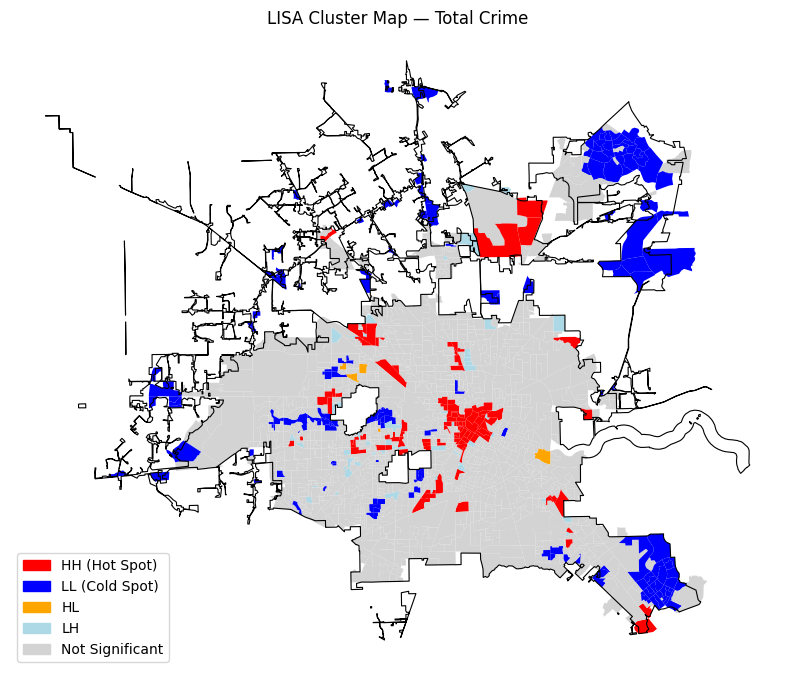

In [31]:
from esda.moran import Moran, Moran_Local
from libpysal.weights import Queen
from libpysal.weights import KNN

# Spatial weights (adjacency) - KNN eliminates islands (separate chunks of contiguous BGs not connected to others)
# w = KNN.from_dataframe(inside_bgs, k=5)
# w.transform = 'r'

# Spatial weights (adjacency)
w = Queen.from_dataframe(inside_bgs)
w.transform = 'r'  # row-standardize

y = inside_bgs['cl_total_count'].values

# --- Global ---
mi = Moran(y, w, permutations=999)
print(f"Global Moran's I: {mi.I:.3f} (p={mi.p_sim:.4f})")
# Higher I = more clustered. Compare this number across cities.

# --- Local (LISA) ---
lisa = Moran_Local(y, w, permutations=999)
inside_bgs['lisa_I'] = lisa.Is           # local I value
inside_bgs['lisa_q'] = lisa.q            # quadrant (1=HH, 2=LH, 3=LL, 4=HL)
inside_bgs['lisa_sig'] = lisa.p_sim < 0.05  # significant at 5%

# LISA cluster map
labels = {1: 'HH (Hot Spot)', 2: 'LH', 3: 'LL (Cold Spot)', 4: 'HL'}
inside_bgs['cluster'] = inside_bgs.apply(
    lambda r: labels[r['lisa_q']] if r['lisa_sig'] else 'Not Significant', axis=1
)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
colors = {'HH (Hot Spot)': 'red', 'LL (Cold Spot)': 'blue', 
           'HL': 'orange', 'LH': 'lightblue', 'Not Significant': 'lightgrey'}
inside_bgs.plot(ax=ax, color=inside_bgs['cluster'].map(colors), edgecolor='none')
city_gdf.boundary.plot(ax=ax, color='black', linewidth=0.8)
ax.set_title("LISA Cluster Map — Total Crime")
ax.set_axis_off()
# Add legend
from matplotlib.patches import Patch
legend_patches = [Patch(color=v, label=k) for k, v in colors.items()]
ax.legend(handles=legend_patches, loc='lower left')
plt.show()

##### Load crime risk model data (with LODES for employment)

In [14]:
# Load model data, employment numbers from lodes and merge with analysis set
crisk_df = load_model_data(bg_all)
lodes_bg = load_lodes_bg()

# Merge crime risk model data with data from the city (inner join)
comparison = merge_model_with_actuals(bg_all, crisk_df)

Model loaded: 300,363 total BGs, 2,108 matched to analysis set
LODES loaded: 2,288,249 blocks -> 237,793 block groups
Merged comparison set: 2,108 BGs
  Inside city: 1,629 | Outside: 479


In [15]:
# Normalize city crime by population and (population + daytime employment from lodes data)
comparison = normalize_actuals(comparison, lodes_bg=lodes_bg)

Normalized actuals to rate/1K: 2,106 BGs with population > 0
Daytime-adjusted rates: 2,108 BGs with daytime_pop > 0


In [16]:
# Examine comparison dataframe
# Counts come from city; pt_ct columns come from Cotality crime risk model; 
# rate refers to crime from city data normalized by population of block group
# rate_daytime refers to crime data from city normalized to (population + daytime employement from LODES)   
comparison.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2108 entries, 0 to 2107
Data columns (total 59 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   geoid                  2108 non-null   str     
 1   within_city            2108 non-null   bool    
 2   geometry               2108 non-null   geometry
 3   bg_key                 2079 non-null   str     
 4   total_count            2108 non-null   float64 
 5   assault_count          2108 non-null   float64 
 6   burglary_count         2108 non-null   float64 
 7   fire_count             2108 non-null   float64 
 8   larceny_count          2108 non-null   float64 
 9   murder_count           2108 non-null   float64 
 10  mvt_count              2108 non-null   float64 
 11  rape_count             2108 non-null   float64 
 12  robbery_count          2108 non-null   float64 
 13  vandal_count           2108 non-null   float64 
 14  violent_count          2108 non-

In [17]:
# Extract national rates and compute weighted scores
national_rates = extract_national_rates()
comparison = compute_weighted_scores(comparison, national_rates)
comparison.info()

National rates extracted: {'violent_pt_u': 3.591, 'murder_pt_u': 0.05, 'rape_pt_u': 0.375, 'robbery_pt_u': 0.606, 'assault_pt_u': 2.561, 'property_pt_u': 17.601, 'burglary_pt_u': 2.292, 'larceny_pt_u': 12.721, 'mvt_pt_u': 2.588}
Weighted scores computed: wtotal_rel median = 1.11, wprop_rel median=1.13
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2108 entries, 0 to 2107
Data columns (total 63 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   geoid                  2108 non-null   str     
 1   within_city            2108 non-null   bool    
 2   geometry               2108 non-null   geometry
 3   bg_key                 2079 non-null   str     
 4   total_count            2108 non-null   float64 
 5   assault_count          2108 non-null   float64 
 6   burglary_count         2108 non-null   float64 
 7   fire_count             2108 non-null   float64 
 8   larceny_count          2108 non-null   float64 


Total Model Score (per 1K pop) Distribution — Inside City (1,629 BGs)
count    1629.000
mean       62.803
std        33.097
min         2.115
25%        39.722
50%        56.857
75%        78.612
max       234.520
Block groups with zero: 0 / 1,629 (0.0%)
------------------------------------------------------------
  P 1:      9.822   (1,612 BGs >= this)
  P 5:     19.342   (1,547 BGs >= this)
  P10:     26.352   (1,466 BGs >= this)
  P25:     39.722   (1,222 BGs >= this)
  P50:     56.857   (815 BGs >= this)
  P75:     78.612   (408 BGs >= this)
  P90:    106.099   (163 BGs >= this)
  P95:    127.982   (82 BGs >= this)
  P99:    165.950   (17 BGs >= this)


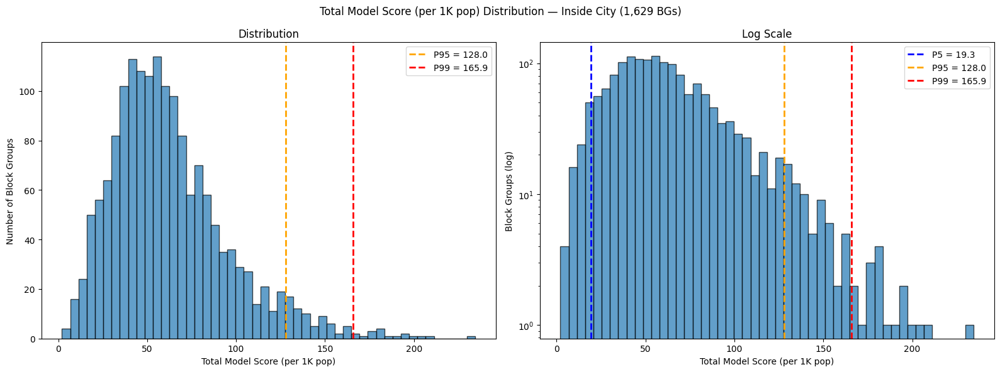

In [18]:
# Model score distributions
# Model doesn't have a cl_total: that's only for city crime data
#for scope in ['all', 'inside', 'outside']:
plot_distribution(comparison, crime_type='total', suffix='pt_ct', block_groups='inside')


Cl_Total Rate (per 1K pop) Distribution — Inside City (1,629 BGs)
count      1628.000
mean        131.622
std        3155.932
min           0.000
25%          15.499
50%          31.372
75%          57.051
max      127200.000
Block groups with zero: 44 / 1,629 (2.7%)
------------------------------------------------------------
  P 1:      0.000   (1,628 BGs >= this)
  P 5:      2.176   (1,546 BGs >= this)
  P10:      6.239   (1,465 BGs >= this)
  P25:     15.499   (1,221 BGs >= this)
  P50:     31.372   (814 BGs >= this)
  P75:     57.051   (407 BGs >= this)
  P90:     98.642   (163 BGs >= this)
  P95:    151.313   (82 BGs >= this)
  P99:    300.036   (17 BGs >= this)


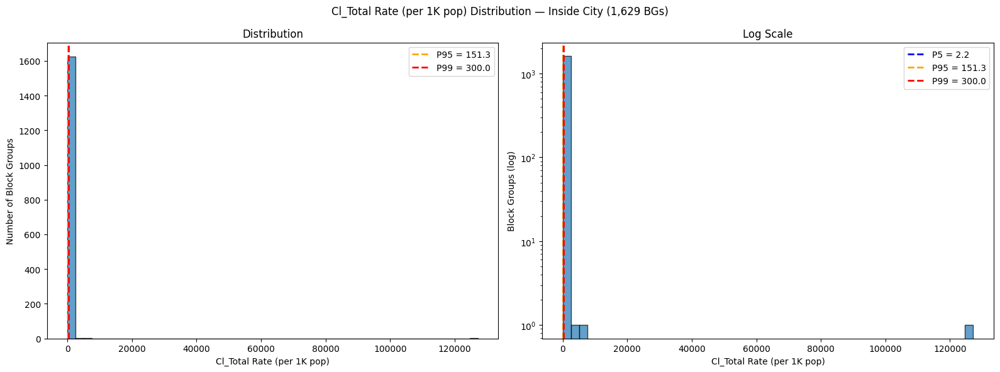


Cl_Total Rate (per 1K daytime pop) Distribution — Inside City (1,629 BGs)
count    1629.000
mean       32.467
std        69.625
min         0.000
25%        11.890
50%        22.901
75%        40.261
max      2550.000
Block groups with zero: 44 / 1,629 (2.7%)
------------------------------------------------------------
  P 1:      0.000   (1,629 BGs >= this)
  P 5:      1.690   (1,547 BGs >= this)
  P10:      5.063   (1,466 BGs >= this)
  P25:     11.890   (1,222 BGs >= this)
  P50:     22.901   (817 BGs >= this)
  P75:     40.261   (408 BGs >= this)
  P90:     64.708   (163 BGs >= this)
  P95:     83.074   (82 BGs >= this)
  P99:    152.947   (17 BGs >= this)


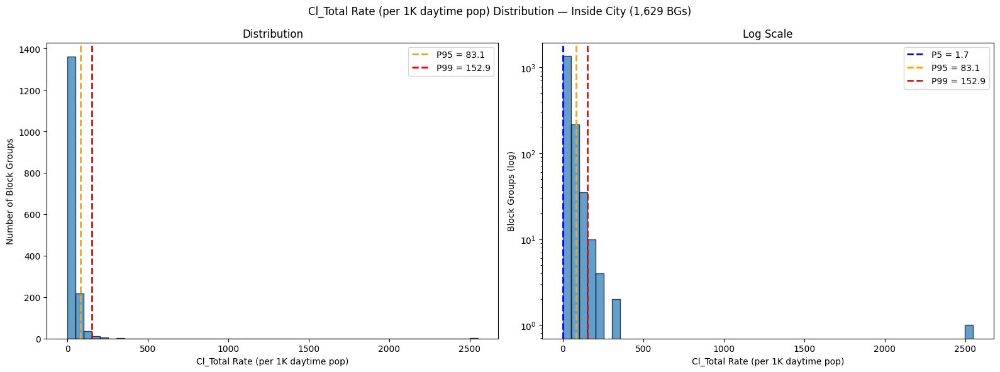

In [19]:
# Check distribution of city crime rate and city crime rate with daytime population added
plot_distribution(comparison, crime_type='cl_total', suffix='rate', block_groups='inside')
plot_distribution(comparison, crime_type='cl_total', suffix='rate_daytime', block_groups='inside')


Cl_Total Rate (per 1K pop) Distribution — Inside City (1,606 BGs)
count    1606.000
mean       43.242
std        43.389
min         0.000
25%        15.352
50%        30.886
75%        55.090
max       280.632
Block groups with zero: 44 / 1,606 (2.7%)
------------------------------------------------------------
  P 1:      0.000   (1,606 BGs >= this)
  P 5:      2.062   (1,525 BGs >= this)
  P10:      6.175   (1,445 BGs >= this)
  P25:     15.352   (1,204 BGs >= this)
  P50:     30.886   (803 BGs >= this)
  P75:     55.090   (402 BGs >= this)
  P90:     93.508   (161 BGs >= this)
  P95:    128.798   (81 BGs >= this)
  P99:    220.452   (17 BGs >= this)


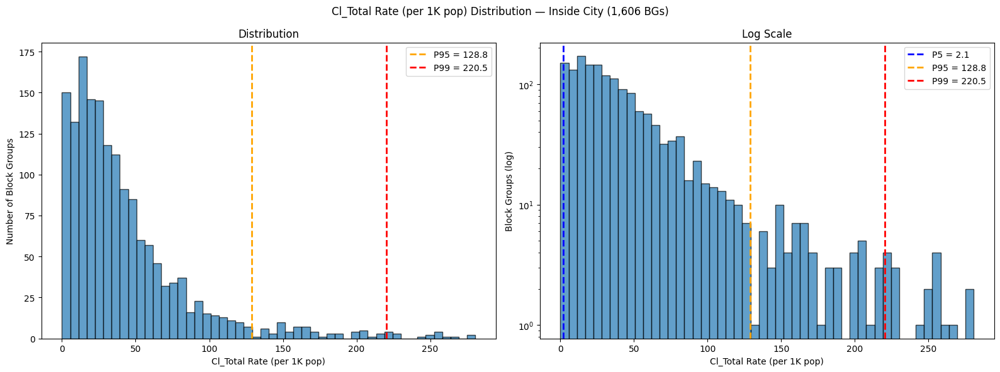


Cl_Total Rate (per 1K daytime pop) Distribution — Inside City (1,607 BGs)
count    1607.000
mean       28.795
std        24.014
min         0.000
25%        11.715
50%        22.629
75%        39.492
max       137.595
Block groups with zero: 44 / 1,607 (2.7%)
------------------------------------------------------------
  P 1:      0.000   (1,607 BGs >= this)
  P 5:      1.670   (1,526 BGs >= this)
  P10:      5.029   (1,446 BGs >= this)
  P25:     11.715   (1,205 BGs >= this)
  P50:     22.629   (804 BGs >= this)
  P75:     39.492   (402 BGs >= this)
  P90:     61.411   (161 BGs >= this)
  P95:     78.067   (81 BGs >= this)
  P99:    109.831   (17 BGs >= this)


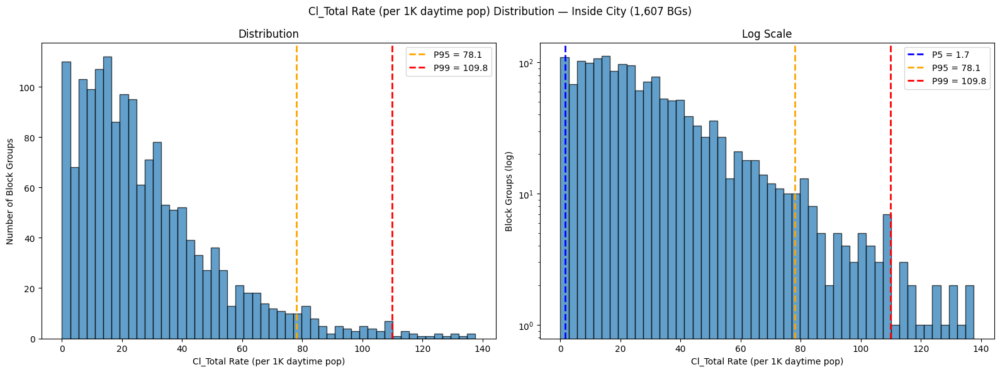

In [20]:
# Using P99 as a cutoff before plotting
p99 = comparison['cl_total_rate'].quantile(0.99)
plot_distribution(comparison[comparison['cl_total_rate'] <= p99], 
                  crime_type='cl_total', suffix='rate', block_groups='inside')

p99d = comparison['cl_total_rate_daytime'].quantile(0.99)
plot_distribution(comparison[comparison['cl_total_rate_daytime'] <= p99d], 
                  crime_type='cl_total', suffix='rate_daytime', block_groups='inside')

In [21]:
# Scanning outliers
threshold = comparison['cl_total_rate'].quantile(0.99)
city_crime_rate_outliers = comparison[comparison['cl_total_rate']>threshold][['geoid','within_city','population','c000','cl_total_count','cl_total_rate','cl_total_rate_daytime']].sort_values(by='cl_total_rate',ascending=False)
print(f"Number of outlier observations: {len(city_crime_rate_outliers)}")
print("="*80)
print(city_crime_rate_outliers)

Number of outlier observations: 22
             geoid  within_city  population     c000  cl_total_count  \
1197  482019801001         True         5.0  22793.0           636.0   
1196  482019800001         True        21.0   1579.0           121.0   
231   482014223032         True        18.0      2.0            51.0   
1346  482013242002         True         8.0   1397.0            12.0   
1392  482014318041         True      1171.0  17634.0          1014.0   
372   482012205001         True       924.0   1854.0           611.0   
110   482014208001         True       635.0   2035.0           410.0   
1212  482014211011         True       930.0   1702.0           528.0   
535   482013331002         True       813.0    419.0           428.0   
175   482013333012         True       788.0   1235.0           346.0   
250   482014319011         True       452.0    905.0           165.0   
121   482015102023         True      1353.0   2042.0           482.0   
794   482014328042         Tr

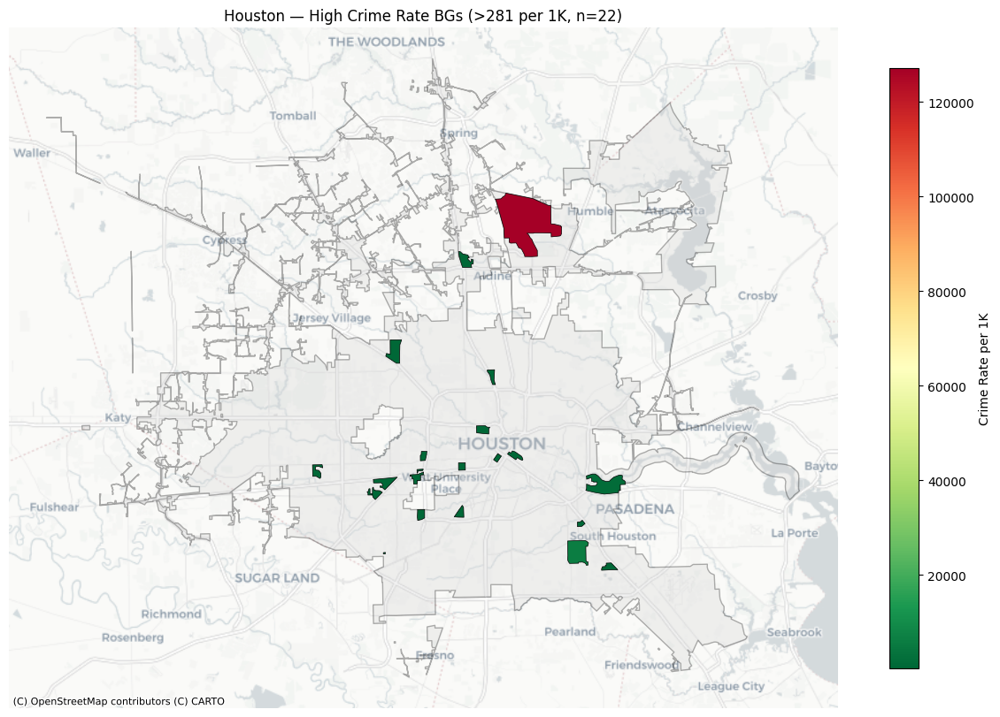

In [22]:
# Get outlier BGs as GeoDataFrame
outlier_gdf = bg_gdf[['geoid', 'geometry']].merge(city_crime_rate_outliers, on='geoid')
outlier_gdf = gpd.GeoDataFrame(outlier_gdf, geometry='geometry', crs='EPSG:4326')

# Plot on city map
fig, ax = plt.subplots(figsize=(12, 10))
city_3857 = city_gdf.to_crs(epsg=3857)
city_3857.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=1, alpha=0.3)
outlier_gdf.to_crs(epsg=3857).plot(ax=ax, column='cl_total_rate', cmap='RdYlGn_r', 
                                    edgecolor='black', linewidth=0.5, legend=True,
                                    legend_kwds={'shrink': 0.7, 'label': 'Crime Rate per 1K'})
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)
ax.set_title(f'Houston — High Crime Rate BGs (>{threshold:.0f} per 1K, n={len(outlier_gdf)})')
ax.set_axis_off()
plt.tight_layout()
plt.show()

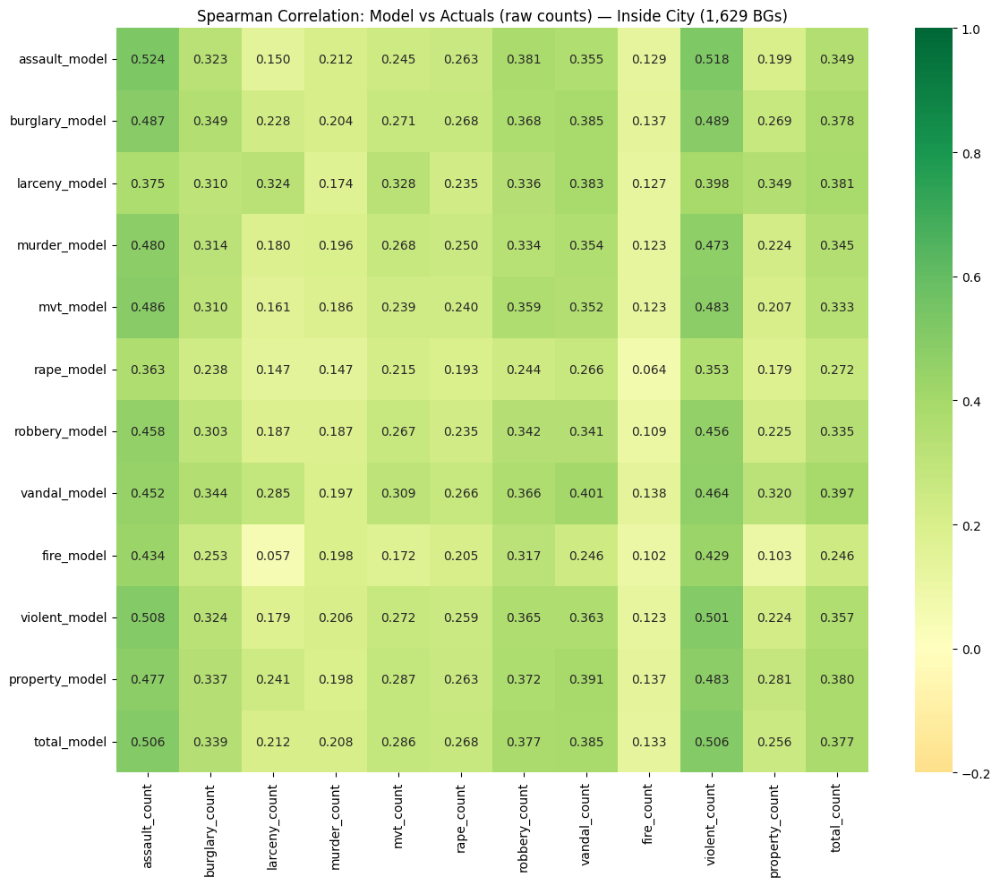


Same-category Spearman correlations — count (Inside City):
     assault: 0.524
    burglary: 0.349
     larceny: 0.324
      murder: 0.196
         mvt: 0.239
        rape: 0.193
     robbery: 0.342
      vandal: 0.401
        fire: 0.102
     violent: 0.501
    property: 0.281
       total: 0.377


In [107]:
# Spearman correlation heatmaps: model vs actual crime counts
#for scope in ['all', 'inside', 'outside']:
plot_correlation_heatmap(comparison, block_groups='inside', actual_suffix='count')

In [31]:
# Check correlation with cl_total_counts
print(f"Correlation between model totals and city totals:")
print("="*80)
print(f"{comparison[['total_pt_ct','cl_total_count']].corr(method='spearman')}")
threshold = comparison['cl_total_count'].quantile(0.9)
comparison_without_outliers = comparison[comparison['cl_total_count'] < threshold]
corr = comparison_without_outliers[['total_pt_ct','cl_total_count']].corr(method='spearman')
print(f"Correlation once outliers are removed: ")
print("="*80)
print(corr)

Correlation between model totals and city totals:
                total_pt_ct  cl_total_count
total_pt_ct        1.000000        0.516263
cl_total_count     0.516263        1.000000
Correlation once outliers are removed: 
                total_pt_ct  cl_total_count
total_pt_ct        1.000000        0.535156
cl_total_count     0.535156        1.000000


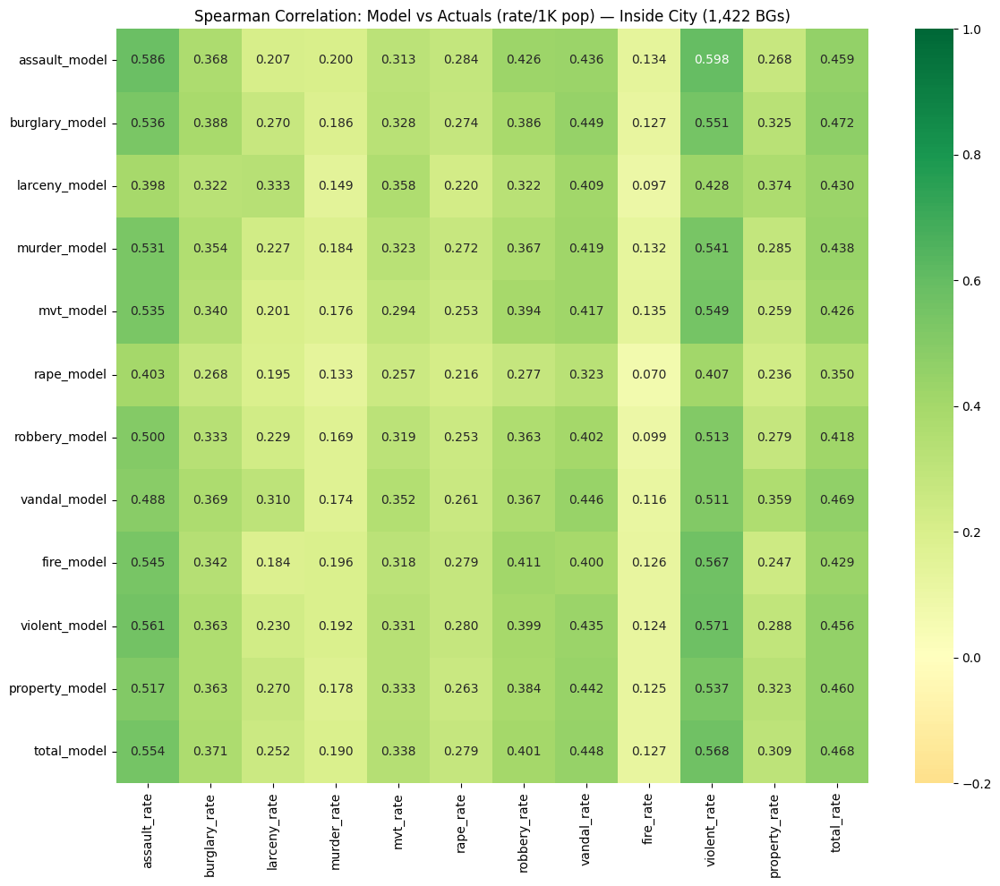


Same-category Spearman correlations — rate (Inside City):
     assault: 0.586
    burglary: 0.388
     larceny: 0.333
      murder: 0.184
         mvt: 0.294
        rape: 0.216
     robbery: 0.363
      vandal: 0.446
        fire: 0.126
     violent: 0.571
    property: 0.323
       total: 0.468


In [34]:
# Spearman correlation heatmaps: model vs NORMALIZED actuals (rate per 1K)
# Remove outliers
threshold = comparison['cl_total_rate'].quantile(0.9)
comparison_minus_outliers = comparison[comparison['cl_total_rate'] <threshold]
#for scope in ['all', 'inside', 'outside']:
plot_correlation_heatmap(comparison_minus_outliers, block_groups='inside', actual_suffix='rate')

In [35]:
# Find correlation between totals from the model and cl_total from city crime data
corr = comparison_minus_outliers[['total_pt_ct', 'cl_total_rate']].corr(method='spearman')
print(corr)

               total_pt_ct  cl_total_rate
total_pt_ct       1.000000       0.564801
cl_total_rate     0.564801       1.000000


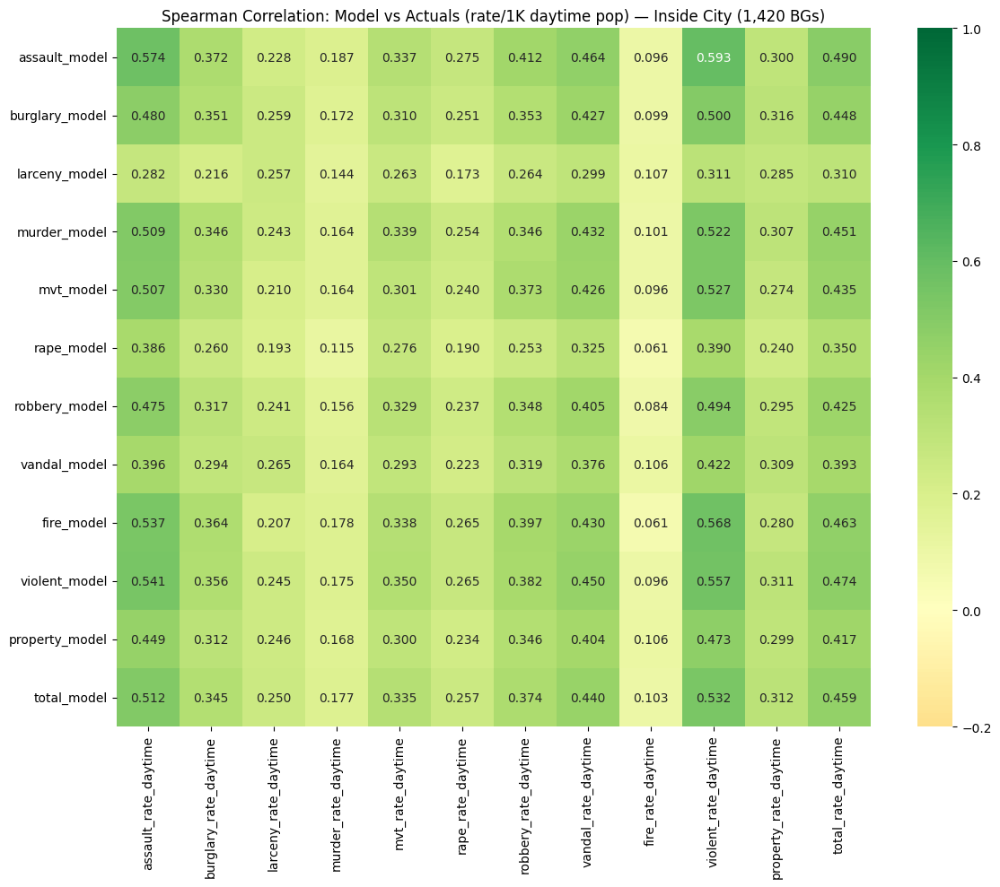


Same-category Spearman correlations — rate_daytime (Inside City):
     assault: 0.574
    burglary: 0.351
     larceny: 0.257
      murder: 0.164
         mvt: 0.301
        rape: 0.190
     robbery: 0.348
      vandal: 0.376
        fire: 0.061
     violent: 0.557
    property: 0.299
       total: 0.459


In [36]:
# Correlation plots with addition of daytime population
# Remove outliers
threshold = comparison['cl_total_rate_daytime'].quantile(0.9)
comparison_minus_outliers = comparison[comparison['cl_total_rate_daytime'] <threshold]
#for scope in ['all','inside','outside']:
plot_correlation_heatmap(comparison_minus_outliers, block_groups='inside', actual_suffix='rate_daytime')

In [37]:
# Find correlation between totals from the model and cl_total from city crime data
corr = comparison_minus_outliers[['total_pt_ct', 'cl_total_rate_daytime']].corr(method='spearman')
print(corr)

                       total_pt_ct  cl_total_rate_daytime
total_pt_ct               1.000000               0.564542
cl_total_rate_daytime     0.564542               1.000000


In [38]:
# Correlation between totals from model and weighted value of crime
threshold = comparison['cl_total_rate'].quantile(0.9)
comparison_minus_outliers = comparison[comparison['cl_total_rate'] <threshold]
corr = comparison_minus_outliers[['total_pt_ct', 'wtotal_rate']].corr(method='spearman')
print(corr)

             total_pt_ct  wtotal_rate
total_pt_ct     1.000000     0.609593
wtotal_rate     0.609593     1.000000


##### Lorenz Curves

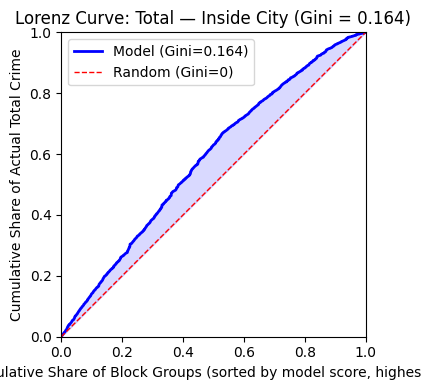


Gini coefficient: 0.164

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             7.1%              1.4x
     10%            14.1%              1.4x
     20%            26.4%              1.3x
     30%            38.6%              1.3x
     50%            63.0%              1.3x
  To capture 50% of total: need top 38.7% of BGs
  To capture 80% of total: need top 69.4% of BGs


np.float64(0.16)

In [45]:
# Lorenz curves + Gini for key categories
categories = ['total','assault','murder', 'violent', 'property',  'burglary', 'larceny', 'robbery']
#for cat in categories:
    #for scope in ['all', 'inside', 'outside']:
plot_lorenz_curve(comparison, crime_type='total', block_groups='inside')

##### Eval data for Lorenz Curves

In [46]:
# Load and prep eval data
evals = load_evals()
evals = extract_bg_geoid(evals)
validate_block_cols(evals)

# Get list of carriers
carriers = evals['carrier'].unique().tolist()
print(f"Available carriers: {carriers}")

Evals loaded: 3,408,855 rows, 4 carriers
Carriers: {'TRAV': 2480028, 'Guard': 638020, 'HANO': 190239, 'OregonMutal': 100568}
Extracted bg_geoid from crime_censusblock. Sample: ['060530140001', '530250111022', '530250111022']
Block column match rate: 100.0%
Available carriers: ['OregonMutal', 'Guard', 'TRAV', 'HANO']


In [47]:
# Aggregate per carrier and merge with city crime data
carrier_name = 'Guard'  # Change per carrier
eval_bg = aggregate_evals_to_bg(evals, carrier=carrier_name)
eval_crime = merge_evals_with_crime(eval_bg, comparison)

Carrier 'Guard': 626,807 rows → 81,418 block groups
  Total exposure: 571,034
  Total claims: 5,394
  Total losses: 65,420,426
Merged: 995 of 81,418 eval BGs matched to city crime data (1.2%)


In [48]:
# Shape of the comparison dataframe
print(f"Total Block groups in our analysis set in {city}: {bg_all.shape[0]} groups")
print(f"Out of total, inside city bgs: {bg_all[bg_all['within_city']==True].shape[0]} groups")
print(f"Out of total, matched with carrier data: {eval_crime.shape[0]} groups")
print(f"Out of matched, inside city bgs: {eval_crime[eval_crime['within_city']==True].shape[0]} groups")

Total Block groups in our analysis set in houston: 2108 groups
Out of total, inside city bgs: 1629 groups
Out of total, matched with carrier data: 995 groups
Out of matched, inside city bgs: 754 groups


##### Common terms used in carrier evalauations:
1. Earned Exposure: Corresponds to one policy in one year. Decimal values represent partial coverage. Rare negative values are an artifact of the carrier's accounting should be excluded from analaysis
2. Premium: The policy premium paid by the insured for the corresponding earned exposure (When earned expsore = 1 premium is the annual premium)
3. Claims: The count of claims paid by the insurance carrier for given loss perils (e.g. theft claims represent all claims where the cause of loss is theft)
4. Losses: The $ amount paid out by the carrier for given loss perils (e.g. theft loss is the amount paid by the carrier where cause of loss is theft)
5. Crime Loss Types:
Theft and Vandalism are the common loss types associated with property insurance
Losses associated with violent crime can take the form of liability losses (e.g. a property owner is sued after a violent crime on their property). We recieve these loses more rarely in carrier evals but they can be very high $ amounts (not included in the evals below).

In [49]:
# Df for lorenz curves and correlations
eval_crime.info()

<class 'pandas.DataFrame'>
RangeIndex: 995 entries, 0 to 994
Data columns (total 69 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   bg_geoid               995 non-null    str     
 1   earned_exposures       995 non-null    float64 
 2   crime_claims           995 non-null    float64 
 3   crime_loss             995 non-null    float64 
 4   total_claims           995 non-null    float64 
 5   total_losses           995 non-null    float64 
 6   geoid                  995 non-null    str     
 7   within_city            995 non-null    bool    
 8   geometry               995 non-null    geometry
 9   bg_key                 977 non-null    str     
 10  total_count            995 non-null    float64 
 11  assault_count          995 non-null    float64 
 12  burglary_count         995 non-null    float64 
 13  fire_count             995 non-null    float64 
 14  larceny_count          995 non-null    float64 
 15  

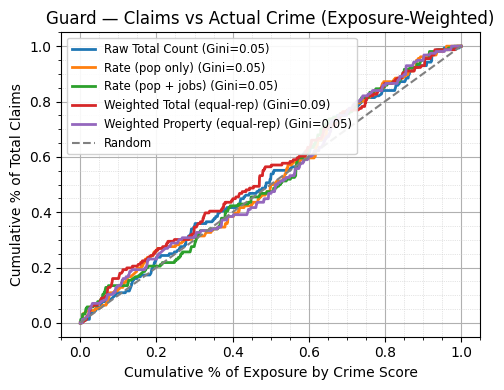

{'cl_total_count': np.float64(0.05),
 'cl_total_rate': np.float64(0.05),
 'cl_total_rate_daytime': np.float64(0.05),
 'wtotal_rel': np.float64(0.09),
 'wprop_rel': np.float64(0.05)}

In [ ]:
# Lorenz curves: sort by actual city crime, measure claims concentration
risk_scores = {
    'cl_total_count': 'Raw Total Count',
    'cl_total_rate': 'Rate (pop only)',
    'cl_total_rate_daytime': 'Rate (pop + jobs)',
    'wtotal_rate': 'Weighted Total (equal-rep)',
    'wprop_rate': 'Weighted Property (equal-rep)',
}

# Exposure-weighted BGs
# 1 exposure is 1 policy in 1 year. Exposures in high-crime areas could be low because preemptiveness
plot_carrier_lorenz_multi(
    eval_crime, 
    risk_score_cols=list(risk_scores.keys()),
    outcome_col='total_claims',
    x_axis='exposure_weighted',
    labels=risk_scores,
    title=f'{carrier_name} — Claims vs Actual Crime (Exposure-Weighted)'
)

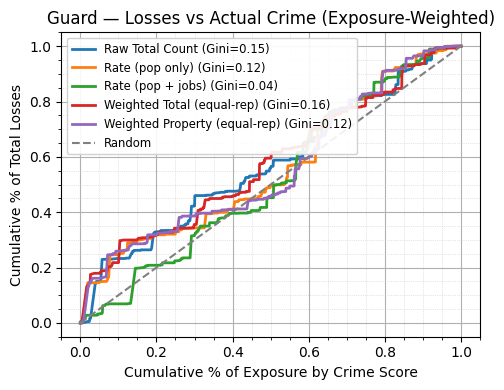

{'cl_total_count': np.float64(0.15),
 'cl_total_rate': np.float64(0.12),
 'cl_total_rate_daytime': np.float64(0.04),
 'wtotal_rel': np.float64(0.16),
 'wprop_rel': np.float64(0.12)}

In [52]:
# Repeat for losses
plot_carrier_lorenz_multi(
    eval_crime,
    risk_score_cols=list(risk_scores.keys()),
    outcome_col='total_losses',
    x_axis='exposure_weighted',
    labels=risk_scores,
    title=f'{carrier_name} — Losses vs Actual Crime (Exposure-Weighted)'
)

In [54]:
# Correlation: Spearman between city crime counts and carrier claims/losses
from scipy.stats import spearmanr

crime_cols = [
    'cl_total_count', 
    'property_count', 
    'violent_count',
    'cl_total_rate', 
    'property_rate', 
    'violent_rate',
    'cl_total_rate_daytime', 
    'property_rate_daytime', 
    'violent_rate_daytime',
    'wtotal_rate',
    'wprop_rate'
    ]
outcome_cols = ['total_claims','total_losses']

corr_data = []
for crime_col in crime_cols:
    for out_col in outcome_cols:
        valid = eval_crime[[crime_col, out_col]].dropna()
        if len(valid) > 10:
            rho, pval = spearmanr(valid[crime_col], valid[out_col])
            corr_data.append({'crime': crime_col, 'outcome': out_col, 'spearman_rho': rho, 'p_value': pval})

corr_df = pd.DataFrame(corr_data)
print(corr_df.pivot(index='crime', columns='outcome', values='spearman_rho').round(3))

outcome                total_claims  total_losses
crime                                            
cl_total_count                0.076         0.074
cl_total_rate                 0.056         0.053
cl_total_rate_daytime         0.017         0.014
property_count                0.070         0.068
property_rate                 0.052         0.049
property_rate_daytime         0.013         0.010
violent_count                 0.077         0.075
violent_rate                  0.055         0.052
violent_rate_daytime          0.024         0.022
wprop_rate                    0.047         0.044
wtotal_rate                   0.080         0.077


#### Fun Experiment

In [34]:
# 1. Get cluster labels from inside_bgs onto eval_crime
cluster_labels = inside_bgs[['geoid', 'cluster']].copy()
eval_crime_clustered = eval_crime.merge(cluster_labels, on='geoid', how='left')

print(eval_crime_clustered['cluster'].value_counts())

# 2. Compute Lorenz Gini within each cluster
def compute_lorenz_gini(df, sort_col, outcome_col):
    """Gini from Lorenz curve: sort by sort_col, cumulate outcome_col."""
    valid = df[[sort_col, outcome_col]].dropna()
    valid = valid[valid[outcome_col] > 0]  # need some outcome to measure
    if len(valid) < 10:
        return np.nan
    valid = valid.sort_values(sort_col)
    cumulative = valid[outcome_col].cumsum() / valid[outcome_col].sum()
    n = len(cumulative)
    lorenz_area = cumulative.sum() / n
    return 2 * (lorenz_area - 0.5)

# 3. Full dataset Gini (what you already have)
gini_all = compute_lorenz_gini(eval_crime_clustered, 'total_count', 'total_losses')

# 4. Within-cluster Ginis
for cluster_name in ['HH (Hot Spot)', 'LL (Cold Spot)', 'Not Significant']:
    subset = eval_crime_clustered[eval_crime_clustered['cluster'] == cluster_name]
    g = compute_lorenz_gini(subset, 'total_count', 'total_losses')
    print(f"{cluster_name:<20} n={len(subset):>4}  Gini={g:.3f}")

print(f"\n{'ALL BGs':<20} n={len(eval_crime_clustered):>4}  Gini={gini_all:.3f}")

cluster
Not Significant    578
LL (Cold Spot)      72
HH (Hot Spot)       70
LH                  31
HL                   3
Name: count, dtype: int64
HH (Hot Spot)        n=  70  Gini=-0.112
LL (Cold Spot)       n=  72  Gini=nan
Not Significant      n= 578  Gini=-0.102

ALL BGs              n= 995  Gini=-0.122
